# Exploratory Data Analysis


## Data collection
output: cleaned and split dataset

### imports

In [62]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from collections import Counter


### Read data and make a copy of it

In [63]:
data = pd.read_csv('../datasets/enron_spam_data.csv')
data_copy = data.copy()
print(data_copy.head())

   Message ID                       Subject  \
0           0  christmas tree farm pictures   
1           1      vastar resources , inc .   
2           2  calpine daily gas nomination   
3           3                    re : issue   
4           4     meter 7268 nov allocation   

                                             Message Spam/Ham        Date  
0                                                NaN      ham  1999-12-10  
1  gary , production from the high island larger ...      ham  1999-12-13  
2             - calpine daily gas nomination 1 . doc      ham  1999-12-14  
3  fyi - see note below - already done .\nstella\...      ham  1999-12-14  
4  fyi .\n- - - - - - - - - - - - - - - - - - - -...      ham  1999-12-14  


### Columns and shape

In [64]:
shape = data_copy.shape
columns = list(data_copy.columns)
print(f"Number of entires: {shape[0]}, number of columns: {shape[1]}")
print(f'columns: {columns}')

Number of entires: 33716, number of columns: 5
columns: ['Message ID', 'Subject', 'Message', 'Spam/Ham', 'Date']


### Detect empty values
negliglible -> delete rows that contains empty

In [65]:
empty_values = data_copy.isnull().sum()
print(empty_values)


Message ID      0
Subject       289
Message       371
Spam/Ham        0
Date            0
dtype: int64


In [66]:
data_copy = data_copy.dropna()

### Detect duplicates
0 -> no action

In [67]:
duplicates = data_copy.duplicated().sum()
print(duplicates)

0


### Label balance inspection
almost 50-50 -> no action


In [68]:
num_of_labels = data_copy['Spam/Ham'].value_counts().to_dict()
print(num_of_labels)
percentage_of_labels = {key:value/len(data_copy) for key,value in num_of_labels.items()}
print(percentage_of_labels)

{'spam': 16614, 'ham': 16493}
{'spam': 0.5018274081010058, 'ham': 0.49817259189899415}


### Split into 3 sets

Sets -> train, validation, test

Use stratification, to preserve spam / ham balance

In [69]:
train_data, temporary_data = train_test_split(
    data_copy,
    test_size=0.3,
    random_state=42,
    stratify=data_copy['Spam/Ham']
)


In [70]:
validation_data, test_data = train_test_split(
    temporary_data,
    test_size=0.5,
    random_state=42,
    stratify=temporary_data['Spam/Ham']
)

## Exploratory Data Analysis

### Message length distribution

Apply the 1.5xIQR rule after preprocessing. Max token number > 1.5IQR = 3353

Also drop char length < 20 (lower boundary from 1.5*IQR, so a rasonable email length)

The 1.5×IQR rule comes from John Tukey’s exploratory data analysis (EDA)

In [71]:
msg_lengths = train_data["Message"].str.len()
char_length_statistics = msg_lengths.describe()

spam_msg_lengths = train_data[train_data['Spam/Ham'] == 'spam']['Message'].str.len()
spam_char_lengths_statistics = spam_msg_lengths.describe()

ham_msg_lengths = train_data[train_data['Spam/Ham'] == 'ham']['Message'].str.len()    
ham_char_lengths_statistics =ham_msg_lengths.describe()

print(char_length_statistics)


count     23174.00000
mean       1510.28601
std        4223.29592
min           1.00000
25%         327.00000
50%         694.00000
75%        1544.00000
max      141870.00000
Name: Message, dtype: float64


In [72]:
q1 = char_length_statistics['25%']
q3 = char_length_statistics['75%']

def calculate_scaled_IQR(q1, q3, scaling_factor = 1.5):
    IQR = q3 -q1
    upper_boundary = int(q3 + scaling_factor*IQR)
    lower_boundary = int(q1 - scaling_factor*IQR)
    return upper_boundary, lower_boundary

upper, lower = calculate_scaled_IQR(q1,q3)
print(upper)
print(lower)

lower = 20 # Own decision
    

3369
-1498


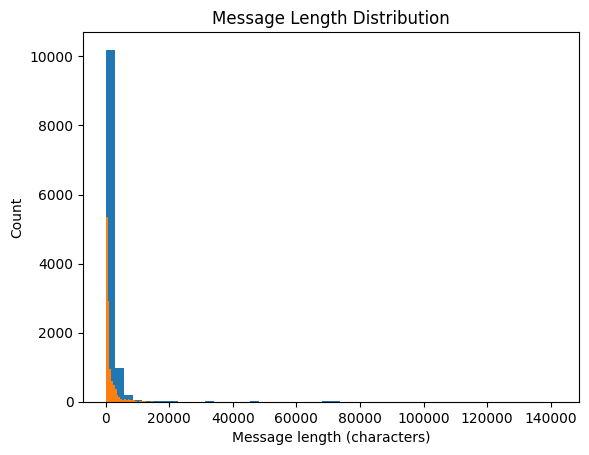

In [73]:
plt.figure()
plt.hist(ham_msg_lengths, bins=50)
plt.hist(spam_msg_lengths, bins=50)
plt.xlabel("Message length (characters)")
plt.ylabel("Count")
plt.title("Message Length Distribution")
plt.show()

### Vocabulary size estimation
reduce to -> 30k

In [74]:
estimated_tokens_train_set = train_data['Message'].astype(str).str.split()
vocab = set(token for msg in estimated_tokens_train_set for token in msg)
vocab_size = len(vocab)
print(vocab_size)
list(vocab)


130051


['catchweight',
 'oldswgrux',
 'vituperative',
 'mgmhrtghp',
 'duhon',
 'veinott',
 'davye',
 'qedvirginian',
 'voormalige',
 'orbigen',
 'earnest',
 'chasing',
 'diorama',
 'consta',
 'iwnyljlmw',
 'fhyesuw',
 'comlokacehttp',
 '24817161',
 'pissanetzky',
 'gqlbthijg',
 'litman',
 'cartiers',
 'gwalior',
 'cmsivhhg',
 '1682426017',
 'fizzle',
 'yanks',
 'weatherrisk',
 'curator',
 'chello',
 'intuitively',
 'gasdaily',
 'licorice',
 '30771',
 '2205',
 'nosebleed',
 'jand',
 'interweb',
 'crandon',
 'disbursements',
 'plagiarism',
 'etgs',
 'ovwernimght',
 'deputy',
 'gssgeomatics',
 'volum',
 'lhm',
 '794',
 'swgas',
 'jdhkydx',
 'jaimeiceland',
 '2985',
 'atapi',
 'volcanoes',
 'respectful',
 'asymmetrical',
 '1238',
 'parnet',
 'sba',
 'prestigous',
 '29133',
 'hummingbird',
 'mysticism',
 'mëdìcâtìon',
 'ficknessive',
 'catamite',
 'brittnyatkins',
 'homophone',
 'softwareremoves',
 'dorteo',
 'tritton',
 'mporo',
 'hgkglcv',
 '7975',
 'slzajac',
 'jkfeuqpr',
 'ze',
 'generously',


### Out of vocabulary rate (OOV) estimation
high oov rate -> check for patterns that can be replaced

In [75]:
oov_tokens = 0

estimated_tokens_validation_set = validation_data['Message'].astype(str).str.split()

for message in estimated_tokens_validation_set:
    for token in message:
        if token not in vocab:
            oov_tokens += 1

oov_rate = oov_tokens / vocab_size
print(oov_rate)

0.12363611198683594


### Patterns to replace

phone numbers, and numbers are replacable

urls, emails and uppercase words are not found

In [76]:
regex_url = r'(?:https?://|www\.)[\w\-]+(?:\.[\w\-]+)*(?:[\w\-\.,@?^=%&:/~\+#]*[\w\-\@?^=%&/~\+#])?'
regex_email = r'\b[a-zA-Z0-9](?:[a-zA-Z0-9._-]*[a-zA-Z0-9])?@[a-zA-Z0-9](?:[a-zA-Z0-9.-]*[a-zA-Z0-9])?\.[a-zA-Z]{2,}\b'
regex_phone = r'\b(?:\+?1[-.\s]?)?\(?\d{3}\)?[-.\s]?\d{3}[-.\s]?\d{4}\b'
regex_num = r'\b\d+(?:\.\d+)?\b'
regex_uppercase = r'\b[A-Z][a-z]*\b'

num_of_urls = train_data['Message'].str.count(regex_url).sum()
num_of_emails = train_data['Message'].str.count(regex_email).sum()
num_of_phone_numbers = train_data['Message'].str.count(regex_phone).sum()
num_of_numbers = train_data['Message'].str.count(regex_num).sum()
num_of_uppercase_words = train_data['Message'].str.count(regex_uppercase).sum()
print(num_of_urls)
print(num_of_emails)
print(num_of_phone_numbers)
print(num_of_numbers)
print(num_of_uppercase_words)



0
0
1350
351429
0


### Most frequent spam / ham tokens

stop words, and punctuations -> remove them


In [77]:
def tokenize_raw(text):
    return text.lower().split()

spam_tokens = []
ham_tokens = []

for _,row in train_data.iterrows():
    tokens = tokenize_raw(row['Message'])
    if row['Spam/Ham'] == 'spam':
        spam_tokens.extend(tokens)
    else:
        ham_tokens.extend(tokens)

spam_counter = Counter(spam_tokens).most_common(120)
ham_counter = Counter(ham_tokens).most_common(120)
print(spam_counter)
print(ham_counter)

[('.', 166652), (',', 105878), ('the', 74204), ('-', 66959), ('to', 56879), ('and', 50909), ('of', 48710), ('_', 37922), (':', 35758), ('a', 35526), ('you', 32384), ('/', 31560), ('in', 31371), ('this', 23919), ('for', 23289), ('is', 22702), ('your', 22695), ('!', 20267), ('$', 15958), ("'", 15572), ('that', 14670), ('|', 14427), (')', 14208), ('with', 13856), ('i', 13711), ('(', 13692), ('be', 13287), ('?', 13272), ('"', 12932), ('or', 12740), ('as', 12380), ('we', 12296), ('on', 11822), ('are', 11688), ('from', 11329), ('our', 11017), ('s', 10938), ('not', 10484), ('it', 10310), ('have', 10101), ('=', 9107), ('will', 8909), ('*', 8358), ('com', 8149), ('all', 7727), ('company', 7591), ('by', 7518), ('at', 7202), ('1', 6778), ('no', 6517), ('%', 6277), ('http', 6258), ('2', 6047), ('e', 6036), ('can', 6015), ('if', 5807), ('an', 5784), ('my', 5780), ('email', 5549), ('3', 5475), ('information', 5335), ('any', 5306), ('more', 5282), ('here', 5212), ('please', 5095), ('has', 5034), ('@'

### Repeated charachters

## Preprocessing
TODO: apply to train, validate, test datasets

### imports

In [78]:
import re
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

### Remove message length outliers

only on train data

In [79]:
def remove_message_length_outliers(data, lower, upper):
    mask = data["Message"].str.len().between(lower, upper, inclusive='both')
    data = data[mask]
    return data
    

train_data = remove_message_length_outliers(train_data, lower=20, upper=upper)

### Replace numbers and phone numbers

In [80]:
def preserve_num_phone(message):
    message = str(message)
    message = re.sub(regex_num, '<NUM>', message)
    message = re.sub(regex_phone, '<PHONE>', message)
    return message

train_data['Message'] = train_data['Message'].apply(preserve_num_phone)
validation_data['Message'] = validation_data['Message'].apply(preserve_num_phone)
test_data['Message'] = test_data['Message'].apply(preserve_num_phone)

### Repeated chars to unified length

In [81]:
def collapse_repeated_chars_and_spaces(message):
    message = str(message)
    message = re.sub(r'\s+', ' ', message).strip()
    message = re.sub(r'(.)\1{2,}', r'\1\1', message)
    return message

train_data['Message'] = train_data['Message'].apply(collapse_repeated_chars_and_spaces)
validation_data['Message'] = validation_data['Message'].apply(collapse_repeated_chars_and_spaces)
test_data['Message'] = test_data['Message'].apply(collapse_repeated_chars_and_spaces)
    

In [82]:
train_data.to_csv('../datasets/train.csv', index=False)
validation_data.to_csv('../datasets/validation.csv', index=False)
test_data.to_csv('../datasets/test.csv', index=False)

### Tokenization

first the tokenizer learns the words with fit on text (vocab size 30k)

then generate padded input sequences (300 token length)

also generate the ground truth spam = 1, ham = 0

In [83]:
MAXLENGTH = 300
custom_filters = '\"\'#&()*+,-./:;<=>@[\\]^_`{|}\t\n'  # keeps !$%?

def fit_tokenizer(tokenizer, texts):
    tokenizer.fit_on_texts(texts)
    return tokenizer

def tokenize_and_pad(tokenizer, texts, max_len):
    sequences = tokenizer.texts_to_sequences(texts)
    padded = pad_sequences(
        sequences,
        maxlen=max_len,
        padding='post',
        truncating='post',
        value=0
    )
    return padded, sequences

tokenizer = Tokenizer(
    num_words = 30000,
    filters = custom_filters,
    lower=False,
    oov_token='<UNK>'
)

tokenizer = fit_tokenizer(tokenizer, train_data['Message'].astype(str))
x_train, x_sequence = tokenize_and_pad(tokenizer, train_data["Message"].astype(str), MAXLENGTH)
y_train = (train_data['Spam/Ham'] == 'Spam').astype(int)


In [84]:
print(list(tokenizer.word_index.items())[:100])

[('<UNK>', 1), ('NUM', 2), ('the', 3), ('to', 4), ('and', 5), ('of', 6), ('you', 7), ('a', 8), ('for', 9), ('in', 10), ('i', 11), ('is', 12), ('your', 13), ('this', 14), ('on', 15), ('!', 16), ('we', 17), ('be', 18), ('that', 19), ('with', 20), ('have', 21), ('enron', 22), ('will', 23), ('?', 24), ('ect', 25), ('from', 26), ('$', 27), ('it', 28), ('as', 29), ('are', 30), ('s', 31), ('at', 32), ('our', 33), ('please', 34), ('com', 35), ('or', 36), ('if', 37), ('not', 38), ('by', 39), ('me', 40), ('all', 41), ('can', 42), ('hou', 43), ('am', 44), ('e', 45), ('subject', 46), ('my', 47), ('no', 48), ('any', 49), ('http', 50), ('would', 51), ('an', 52), ('%', 53), ('do', 54), ('here', 55), ('has', 56), ('was', 57), ('more', 58), ('pm', 59), ('message', 60), ('time', 61), ('us', 62), ('t', 63), ('get', 64), ('cc', 65), ('know', 66), ('email', 67), ('thanks', 68), ('out', 69), ('vince', 70), ('new', 71), ('up', 72), ('one', 73), ('information', 74), ('been', 75), ('but', 76), ('mail', 77), ('

In [85]:

#print("Word index:", tokenizer.word_index)
print("Number of unique tokens:", len(tokenizer.word_index))
print("\nSequences:", x_sequence)
print("\nPadded sequences:\n", x_train)

labels = [0, 0, 1, 0] 
y = np.array(labels)
print("\nLabels:", y)


np.savetxt('x_train.txt', x_train, fmt='%d', delimiter=' ')

Number of unique tokens: 96959

Sequences: [[1637, 1, 18355, 7266, 24869, 1, 1, 1, 1, 18356, 2204, 12, 2714, 67, 38, 2000, 8876, 24, 31, 2506, 5648, 2, 99, 53, 36, 2085, 205, 45, 6103, 1, 1571, 3755, 1, 24870, 1, 1333, 1553, 16384, 12032, 1, 24871, 1, 1, 24872, 7456, 1, 18357, 1, 24873, 54, 24874, 1264, 1, 3852, 18358, 1, 21181, 24875, 13695, 10351, 24876, 11354, 16385, 1, 1, 5649, 14797, 1, 1, 1, 21182, 13696, 13697, 21183, 1849, 21184, 21185, 5021, 12033, 24877, 1, 1, 3805, 14798, 14799, 1, 737, 16386, 21186, 1, 24878, 16387, 21187, 12034, 24879, 1, 21188, 3938, 21189, 2434, 24880, 9943, 14800, 14801, 4561, 11355, 16388, 9944, 1, 24881, 21190, 14802, 16389, 1, 1, 14803, 7266, 24882, 1, 1, 1, 8573, 28, 216, 1, 1, 24883, 1264, 4313, 1, 2626, 18359, 18360, 739, 21191, 18361, 13698, 24884, 1911, 7100, 1, 1, 2943, 21192, 24885, 18362, 12757, 7267, 1, 1, 13699, 1, 18363, 1, 1, 2374, 5165, 7268, 8068, 1, 1900, 1751, 1, 1542, 21193, 1, 18364, 5870, 1, 1, 24886, 14804, 11356, 24887, 104, 2488

TODO:  build LSTM, make notebook for LLM, build LLM OOP style???

TODO: pre-tokenization EDA - message lengths, new tokens, artifact effects (max length, num_words model paramters)

TODO: post-tokenization EDA - sequence lengths, vocab coverage OOV rates (model parameters)
